&nbsp;

# Exploration Project 16

### Pix2Pix Coloring


<hr>

## ◈ 내용 정리

### ▶ 조건 없는 생성모델(Unconditional Generative Model), GAN

 - 원하는 종류의 이미지를 바로 생성해 내지 못함

 - GAN의 입력은 노이즈. 노이즈를 이미지로 변환.


### ▶ 조건 있는 생성모델(Conditional Generative Model), cGAN
 
 - 원하는 종류의 이미지를 생성할 수 있도록 고안된 방법
 
 - cGAN의 입력은 2개(노이즈 및 레이블 정보).
 
 - fully-connected 레이어를 연속적으로 쌓아 구성
 
 
### ▶ Pix2Pix
 
 - 원하는 이미지를 얻기 위해 이미지를 조건으로 지정
 
 - 이미지를 입력으로 하여 원하는 다른 형태의 이미지로 변환

 - 이미지 변환이 목적인 Pix2Pix는 이미지를 다루는데 효율적인 convolution 레이어를 활용
 
 - [Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/pdf/1611.07004.pdf)

 - 한 이미지의 픽셀에서 다른 이미지의 픽셀로(pixel to pixel) 변환한다는 뜻에서 Pix2Pix
 
 - 최근 활발하게 연구 및 응용되는 GAN 기반의 Image-to-Image Translation 작업에서 가장 기초가 되는 연구
 

- Generator：EncoderDecoder 구조<br>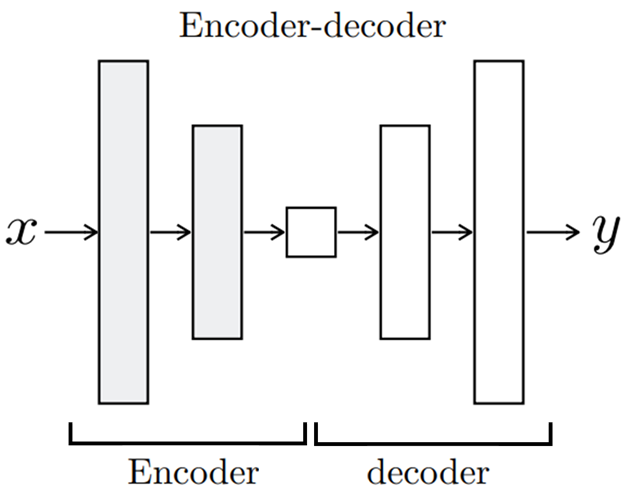

- Encoder-Decoder 구조
   + Encoder에서 입력 이미지(xx)를 받으면 단계적으로 이미지를 down-sampling 하면서 입력 이미지의 중요한 representation을 학습.
   + Decoder에서는 이를 이용해 반대로 다시 이미지를 up-sampling하여 입력 이미지와 동일한 크기의 변환된 이미지(yy)를 생성.
   + 이러한 과정은 모두 convolution 레이어로 진행되며, 레이어 내의 수많은 파라미터를 학습하여 잘 변환된 이미지를 얻도록 한다.
   + Encoder의 최종 출력은 위 그림 중간에 위치한 가장 작은 사각형. (bottleneck)
   + bottleneck：입력 이미지($x$)의 가장 중요한 특징만을 담음

- Generator：U-Net 구조<br>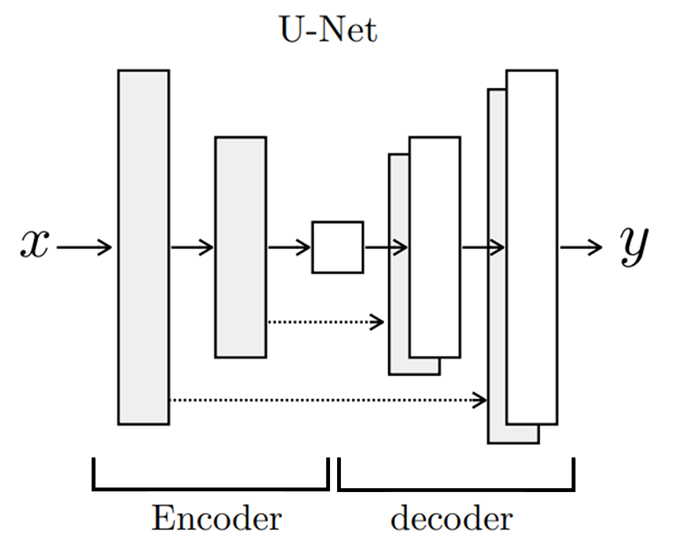

- Generator：U-Net 구조의 Encoder-Decoder로 구성된 Generator와 다른 점
   + 각 레이어마다 Encoder와 Decoder가 연결(skip connection)되어 있다.
   + Decoder가 변환된 이미지를 더 잘 생성하도록 Encoder로부터 더 많은 추가 정보를 이용하는 방법.
   + 단순한 Encoder-Decoder 구조의 Generator를 사용한 결과에 비해 비교적 선명한 결과 이미지를 얻는것이 가능.

- Discriminator 구조<br>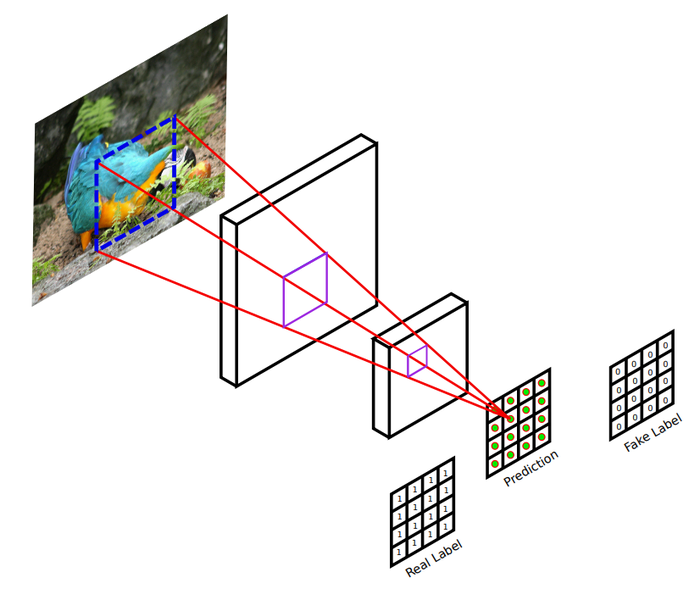

- Discriminator
   + 하나의 이미지가 Discriminator의 입력으로 들어오면, convolution 레이어를 거쳐 확률 값을 나타내는 최종 결과를 생성
   + 결과는 하나의 값이 아닌 여러 개의 값을 가짐. (위 그림의 Prediction은 16개의 값을 가짐.)
   + 입력 이미지의 파란색 점선은 여러 개의 출력 중 하나의 출력을 계산하기 위한 입력 이미지의 receptive field 영역<br>
   → 전체 영역을 다 보는 것이 아닌 일부 영역(파란색 점선)에 대해서만 진짜/가짜를 판별하는 하나의 확률 값을 도출
   + 위와 같은 방식으로 서로 다른 영역에 대해 진짜/가짜를 나타내는 여러 개의 확률 값을 계산<br>
   → 이 값을 평균하여 최종 Discriminator의 출력을 생성：이미지의 일부 영역(patch)을 이용한다고 하여 PatchGAN

### ▶ PatchGAN

- 일반적으로 이미지에서 거리가 먼 두 픽셀은 서로 연관성이 거의 없다.

- 특정 크기의 일부 영역에 대해 세부적으로 진짜/가짜를 판별 → Generator가 더 진짜 같은 이미지를 만들도록 하는 방법

&nbsp;

<hr>

## ▣ 프로젝트 : Segmentation map 으로 도로 이미지 만들기

&nbsp;

앞서 노드 학습 부분에서 알아본 Pix2Pix 모델에 대해서 직접 구현하고 실험해 보자.

## 01 > TensorFlow 및 기타 라이브러리 가져오기


In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

## Augmentation
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

## Model
from tensorflow.keras import layers, Input, Model

## Train - Test
from tensorflow.keras import losses

print(np.__version__)
print(tf.__version__)

1.21.4
2.6.0


&nbsp;

## 02 > 데이터셋 가져오기

사용해 볼 데이터셋은 cityscapes 라는 데이터셋이다.

In [2]:
train_path = os.getenv("HOME")+"/aiffel/conditional_generation/data/cityscapes/train/"
valid_path = os.getenv("HOME")+"/aiffel/conditional_generation/data/cityscapes/val/"
print("number of train examples :", len(os.listdir(train_path)))
print("number of valid examples :", len(os.listdir(valid_path)))

number of train examples : 1000
number of valid examples : 5


- train 데이터셋： 1000 개의 이미지
- valid 데이터셋： 5개의 이미지

이미지를 하나 열어서 크기를 확인 해 보자.

In [3]:
f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


아래 코드를 이용해 각각의 이미지들이 어떻게 생겼는지 확인해 보자.

학습용 데이터셋에서 임의로 6 장을 선택하여 시각화한다.

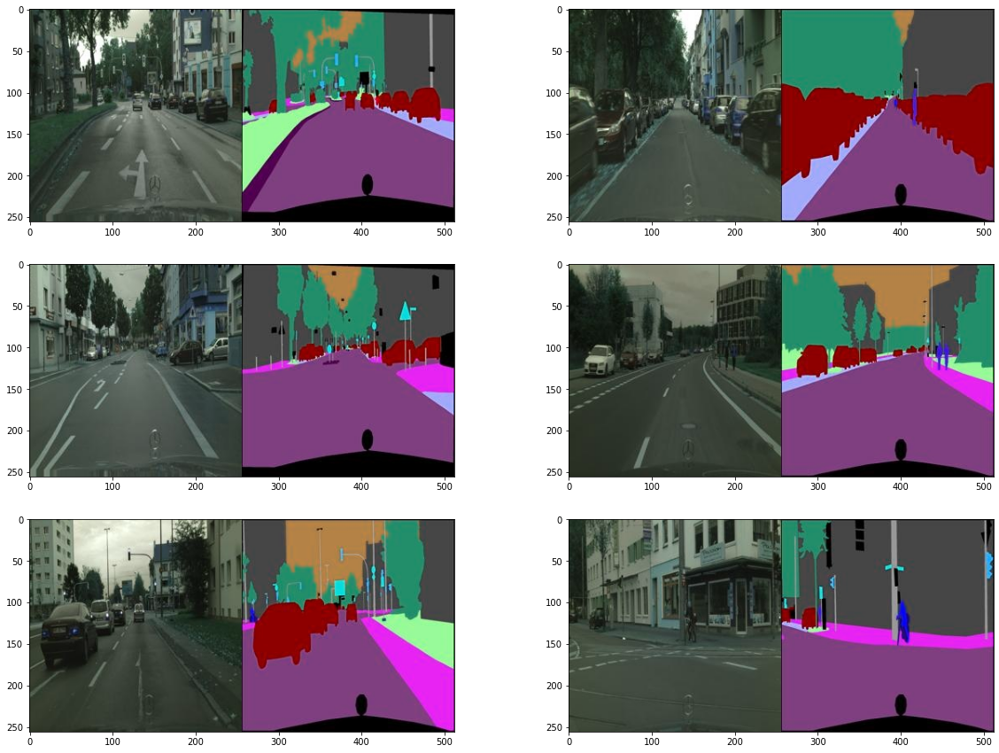

In [4]:
plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_path + os.listdir(train_path)[np.random.randint(len(os.listdir(train_path)))]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

이미지의 사이즈는 (256, 512, 3) 이었고, 위와 같은 형식의 이미지이다.

모델 학습에 사용할 데이터를 (256, 256, 3) 크기의 2개 이미지로 분할하여 사용하도록 하겠다.

여기서, 가로 512 px 이미지의 절반을 나누어, 절반까지는 원본(왼편 이미지), 절반 이후(오른편 이미지)부터는 스케치 이미지로 사용하도록 한다.

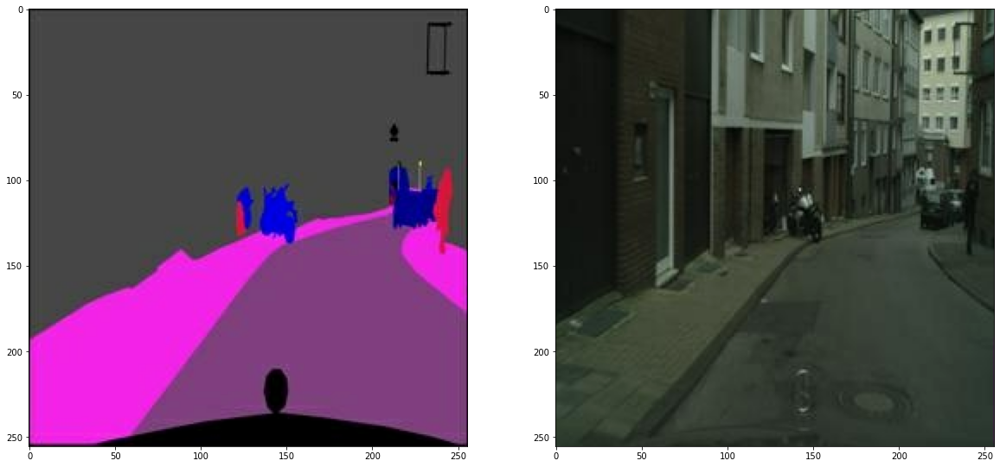

In [5]:
def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x / 127.5) - 1

def denormalize(x):
    x = (x + 1) * 127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, channels=3)
    
    # Split each image tensor into two tensors:
    # - one with a real building facade image
    # - one with an architecture label image 
    w = tf.shape(img)[1] // 2
    sketch = img[:, w:, :] 
    colored = img[:, :w, :] 
    
    # Convert both images to float32 tensors
    sketch = tf.cast(sketch, tf.float32)
    colored = tf.cast(colored, tf.float32)
    
    return normalize(sketch), normalize(colored)

f = train_path + os.listdir(train_path)[np.random.randint(len(os.listdir(train_path)))]
sketch, colored = load_img(f)

plt.figure(figsize=(20,15))
plt.subplot(1,2,1); plt.imshow(denormalize(sketch))
plt.subplot(1,2,2); plt.imshow(denormalize(colored))

학습에 사용할 수 있는 데이터의 수는 약 1000 개 뿐이다.

학습에 사용하는 데이터의 다양성을 높이기 위해 아래와 같이 여러 augmentation 방법을 적용하겠다.

- Augmentation
   + padding (tf.pad)：50% 확률로 Refection padding 또는 constant padding이 30픽셀의 pad width 만큼적용.
   + ~~resize (tf.image.resize)：더 큰 높이와 너비로 이미지의 크기를 조정~~
   + crop (tf.image.random_crop)：(256,256,6) 크기를 가진 이미지를 임의로 크롭.
   + flip (tf.image.random_flip_left_right)：50% 확률로 좌우로 플립(뒤집기).
   + flip (tf.image.random_flip_up_down)：50% 확률로 위아래로 플립(뒤집기).
   + rotate (tf.image.rot90)：50% 확률로 회전

In [6]:
@tf.function()    # 빠른 텐서플로 연산을 위해 @tf.function()을 사용 
def apply_augmentation(sketch, colored):
 
    ## ① 두 이미지가 채널 축으로 연결. (tf.concat). 
    ## 두 이미지가 각각 3채널인 경우 6채널이 된다
    stacked = tf.concat([sketch, colored], axis=-1)

    _pad = tf.constant([[30,30],[30,30],[0,0]])
    
    ## ② 각 50% 확률로 Refection padding 또는 constant padding이
    ## 30픽셀의 pad width 만큼적용. (tf.pad)
    if tf.random.uniform(()) < 0.5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    ## ③ (256,256,6) 크기를 가진 이미지를 임의로 크롭. (tf.image.random_crop)
    out = image.random_crop(padded, size=[256, 256, 6])
    
    # ④ 50% 확률로 가로로 플립. (tf.image.random_flip_left_right)
    out = image.random_flip_left_right(out)
    
    ## ⑤ 50% 확률로 세로로 플립. (tf.image.random_flip_up_down)
    out = image.random_flip_up_down(out)
    
    ## ⑥ 50% 확률로 회전. (tf.image.rot90)
    if tf.random.uniform(()) < 0.5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]

print("✅")

✅


위에서 구성한 함수를 데이터에 적용하여 시각화하자.

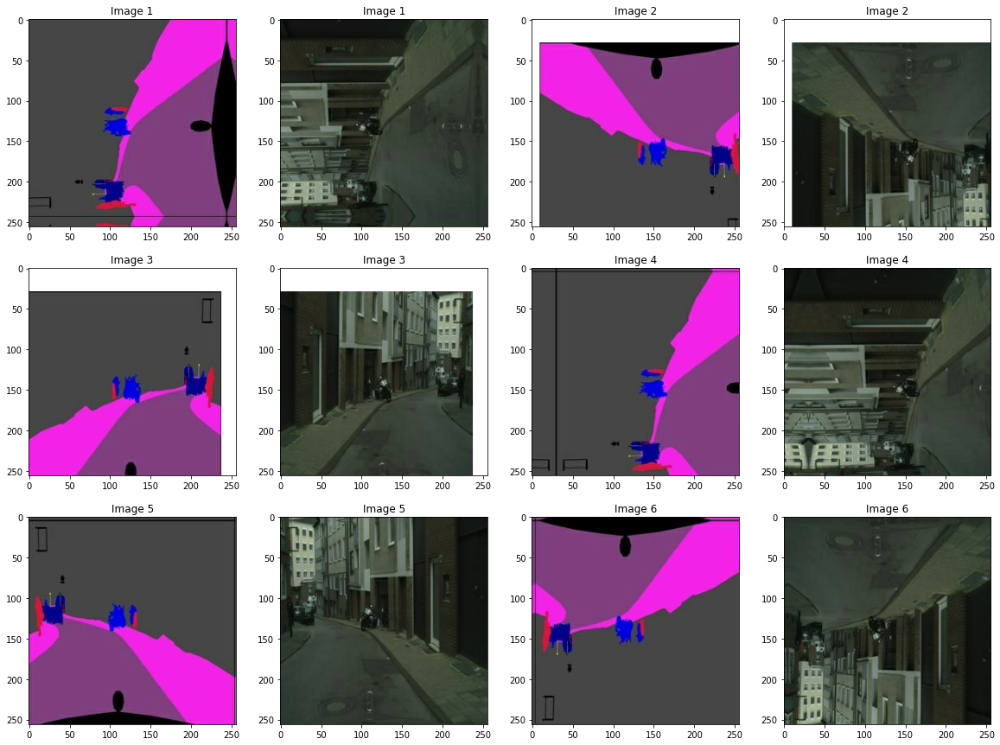

In [7]:
plt.figure(figsize=(20,15))
img_n = 1
for i in range(1, 13, 2):
    augmented_sketch, augmented_colored = apply_augmentation(sketch, colored)

    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_sketch))
    plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_colored))
    plt.title(f"Image {img_n}")
    img_n += 1

다양한 이미지가 생성된 것을 확인할 수 있다.

마지막으로 위 과정들을 학습 데이터에 적용하고, 잘 적용되었는지 하나의 이미지만 시각화하여 확인해 보자.

In [8]:
from tensorflow import data

## Tensorflow 가이드의 내용을 참고하여 인용하였다.
BUFFER_SIZE = 100
BATCH_SIZE = 4    ## 1 이 가장 결과가 좋다고 하였으나, 까만색 이미지 나옴. 사용 불가

def get_train(img_path):
    sketch, colored = load_img(img_path)
    sketch, colored = apply_augmentation(sketch, colored)
    return sketch, colored

print("train_path :", train_path)
train_images = data.Dataset.list_files(train_path + "*.jpg")
# train_images = train_images.map(get_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
train_images = train_images.map(get_train, num_parallel_calls=tf.data.AUTOTUNE).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

train_path : /aiffel/aiffel/conditional_generation/data/cityscapes/train/


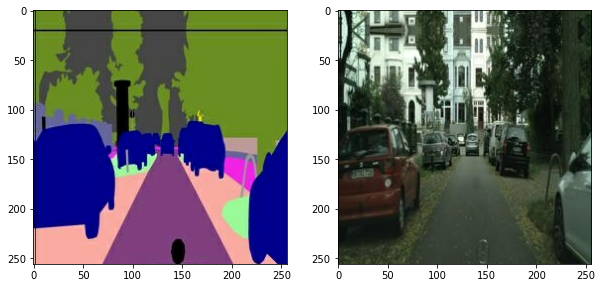

In [9]:
sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
sketch, colored = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(sketch[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(colored[0].astype(np.uint8))

&nbsp;

## 03 > Generator 구성하기

pix2pix 논문에서 Generator 구성에 관한 내용부분은 아래와 같다.

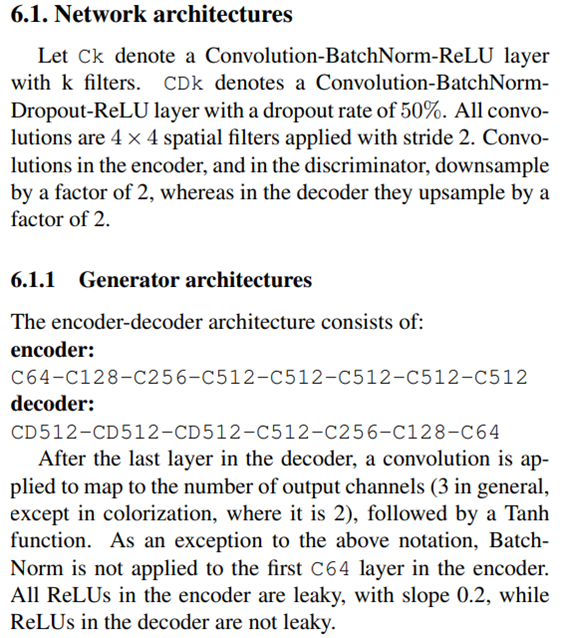

아래에 Generator의 전체 구조를 보기 쉽게 표현한 그림이 있다.

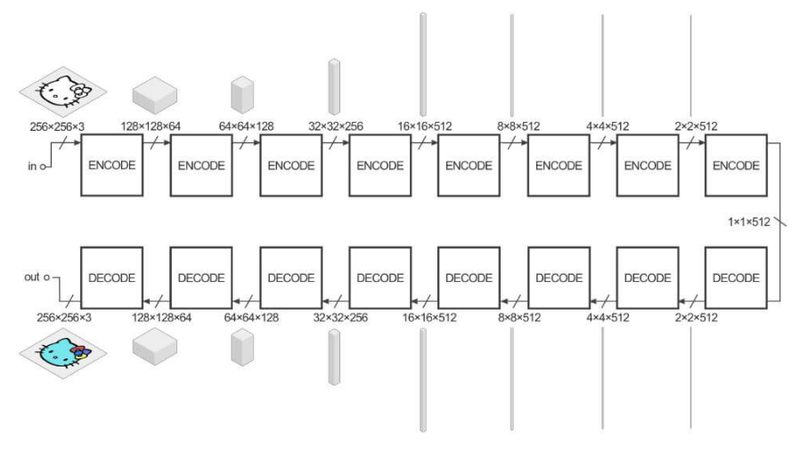<br>
[https://neurohive.io/en/popular-networks/pix2pix-image-to-image-translation/](https://neurohive.io/en/popular-networks/pix2pix-image-to-image-translation/)<br>

위 그림에서 

- 입출력 크기：ENCODE 또는 DECODE라고 쓰인 각각의 블록을 기준으로 양쪽에 쓰여진 내용


- Encoder：
   + "in"이라고 쓰여진 입력 부분부터 윗줄의 화살표를 쭉 따라가면
   + 계산된 결과의 (width, height) 크기가 점점 절반씩 줄어들며
   + 최종적으로 (1,1)이 되고, 
   + 채널의 수는 512까지 늘어나는 것을 확인할 수 있다.
   + 처음 입력부터 시작해서 (1,1,512) 크기를 출력하는 곳까지가 Encoder 부분


- Decoder：
   + 아랫줄 화살표를 따라가면 (width, height) 크기가 점점 두 배로 늘어나 다시 (256, 256) 크기가 되고
   + 채널의 수는 점점 줄어들어 처음 입력과 같이 3채널이 된다.
   + (1,1,512)를 입력으로 최종 출력까지의 연산들이 Decoder 부분

위 정보들을 토대로 Generator 를 구현해 보자.

Generator의 Encoder 부분을 구현한다.

- Convolution → BatchNorm → LeakyReLU 의 3개 레이어로 구성된 기본적인 블록을 하나의 레이어로 만든다.

In [10]:
## Tensorflow 가이드의 내용을 참고하여 인용하였다.
OUTPUT_CHANNELS = 3

In [11]:
class EncodeBlock(layers.Layer):
    ## n_filters, use_bn를 설정하여 사용할 필터의 개수와 BatchNorm 사용 여부를 결정
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        
        ## 기본적으로 Convolution → BatchNorm → LeakyReLU 3개 레이어로 구성
        ## Convolution：필터의 크기(=4), stride(=2)는 모든 곳에서 고정적으로 사용
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        ## LeakyReLU 활성화 함수：slope coefficient(=0.2)는 모든 곳에서 고정되어 사용
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)
    
print("✅")

✅


Encoder에 사용할 기본 블록을 구성했으니, 이 블록을 여러 번 가져다 사용하여 아래와 같이 Encoder를 구성할 수 있다.

In [12]:
class Encoder(layers.Layer):
    def __init__(self):
        super(Encoder, self).__init__()
        ## 각 블록을 거치면서 사용할 필터의 개수를 filters라는 리스트에 지정
        filters = [64,128,256,512,512,512,512,512]
        
        ## blocks이라는 리스트에 사용할 블록들을 정의
        self.blocks = []
        for i, f in enumerate(filters):
            if i == 0:
                ## Encoder 첫 번째 블록에서는 BatchNorm 사용하지 않음
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    ## call() 메서드에서 차례대로 블록들을 통과
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


In [13]:
Encoder().get_summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encode_block (EncodeBlock)   (None, 128, 128, 64)      3072      
_________________________________________________________________
encode_block_1 (EncodeBlock) (None, 64, 64, 128)       131584    
_________________________________________________________________
encode_block_2 (EncodeBlock) (None, 32, 32, 256)       525312    
_________________________________________________________________
encode_block_3 (EncodeBlock) (None, 16, 16, 512)       2099200   
_________________________________________________________________
encode_block_4 (EncodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
encode_block_5 (EncodeBlock) (None, 4, 4, 512)         419635

1. 블록을 통과할수록 (width, height) 크기는 반씩 줄어들고,

2. 사용된 필터의 수는 최대 512개로 늘어나

3. 최종 (1,1,512)로 알맞은 크기가 출력

Generator의 Decoder를 구현한다.

Encoder와 마찬가지로 사용할 기본 블록을 정의.

 - Transposed convolution → Batch normalization → Dropout (처음 세개의 블록만 적용) → ReLU 레이어로 구성.

In [14]:
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)    ## Transposed convolution
        x = self.batchnorm(x)    ## Batch normalization
        if self.dropout:
            x = layers.Dropout(0.5)(x)    ## Dropout (처음 세개의 블록만 적용) 
        return self.relu(x)    ## ReLU
    
print("✅")

✅


Decoder에 사용할 기본 블록을 구성했으니, 이 블록을 여러 번 가져다 사용하여 아래와 같이 Decoder를 구성할 수 있다.

In [15]:
class Decoder(layers.Layer):
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64]
        
        self.blocks = []
        for i, f in enumerate(filters):
            if i < 3:
                ## 처음 세 개의 블록에서만 Dropout을 사용
                self.blocks.append(DecodeBlock(f))
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        ## 마지막 convolution에는 3개의 필터를 사용해 출력
        self.blocks.append(layers.Conv2DTranspose(
            filters=3, kernel_size=4, strides=2, padding="same", use_bias=False))
        
    def call(self, x):
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,512)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
print("✅")

✅


(1,1,512) 크기의 데이터가 입력되었을 때, 어떤 크기가 출력되는지 확인해보자.

In [16]:
Decoder().get_summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 1, 1, 512)]       0         
_________________________________________________________________
decode_block (DecodeBlock)   (None, 2, 2, 512)         4196352   
_________________________________________________________________
decode_block_1 (DecodeBlock) (None, 4, 4, 512)         4196352   
_________________________________________________________________
decode_block_2 (DecodeBlock) (None, 8, 8, 512)         4196352   
_________________________________________________________________
decode_block_3 (DecodeBlock) (None, 16, 16, 512)       4196352   
_________________________________________________________________
decode_block_4 (DecodeBlock) (None, 32, 32, 256)       2098176   
_________________________________________________________________
decode_block_5 (DecodeBlock) (None, 64, 64, 128)       5248

1. (width, height) 크기가 점점 늘어나고
2. 사용 필터의 수는 점점 줄어들어
3. 최종 (256,256,3) 크기로 알맞게 출력

tf.keras.Model을 상속받아 Encoder와 Decoder를 연결해 Generator를 구성하면 아래 코드와 같다.

하지만 여기서는 U-Net 모델을 사용할 것이므로 구현은 하여도 사용하지는 않을 것이다.

In [17]:
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        
EncoderDecoderGenerator().get_summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
encoder_1 (Encoder)          (None, 1, 1, 512)         19544576  
_________________________________________________________________
decoder_1 (Decoder)          (None, 256, 256, 3)       19542784  
Total params: 39,087,360
Trainable params: 39,076,480
Non-trainable params: 10,880
_________________________________________________________________


&nbsp;

## 04 > Generator 재구성 (U-Net)

Pix2Pix의 Generator 구조는 아래 그림처럼 두 가지를 제안하고 있다.

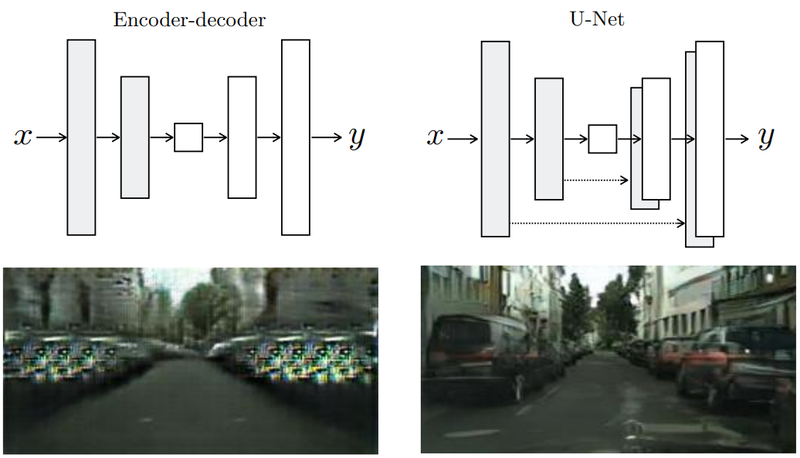

단순한 Encoder-Decoder 구조에 비해 

Encoder와 Decoder 사이를 skip connection으로 연결한 U-Net 구조를 사용한 결과가

훨씬 더 실제 이미지에 가까운 품질을 보인다.

- Encoder-Decoder 구조
   + Encoder에서 출력된 결과를 Decoder의 입력으로 연결
   
   
- U-Net 구조
   + Encoder와 Decoder 사이를 skip connection으로 연결

이전에 구현했던 것들을 조금 수정하여 위 그림의 U-Net 구조를 만들고 실험해 보자,

Encoder 및 Decoder에 사용되는 기본적인 블록은 특별히 수정해야 할 부분은 없으므로 재사용한다.

In [18]:
## Tensorflow 가이드의 내용을 참고하여 인용하였다.
## initializer, kernel_initializer=initializer 부분 추가.

class EncodeBlock(layers.Layer):
    ## n_filters, use_bn를 설정하여 사용할 필터의 개수와 BatchNorm 사용 여부를 결정
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        initializer = tf.random_normal_initializer(0., 0.02)
        
        ## 기본적으로 Convolution → BatchNorm → LeakyReLU 3개 레이어로 구성
        ## Convolution：필터의 크기(=4), stride(=2)는 모든 곳에서 고정적으로 사용
#         self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", kernel_initializer=initializer, use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        ## LeakyReLU 활성화 함수：slope coefficient(=0.2)는 모든 곳에서 고정되어 사용
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)
    
print("✅")

class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        initializer = tf.random_normal_initializer(0., 0.02)
        
        self.dropout = dropout
#         self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", kernel_initializer=initializer, use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)    ## Transposed convolution
        x = self.batchnorm(x)    ## Batch normalization
        if self.dropout:
            x = layers.Dropout(0.5)(x)    ## Dropout (처음 세개의 블록만 적용) 
        return self.relu(x)    ## ReLU
    
print("✅")

✅
✅


정의된 블록들을 이용해 한 번에 U-Net Generator를 정의해 보자.

아래 모델의 __init__() 메서드에서 Encoder 및 Decoder에서 사용할 모든 블록들을 정의해 놓고,

call()에서 forward propagation 하도록 한다. 

이전 구현에는 없었던 skip connection이 call() 내부에서 어떻게 구현되었는지 잘 확인해 보자.

In [19]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        
        ## Encoder 및 Decoder에서 사용할 블록들을 정의
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
#         self.last_conv = layers.Conv2DTranspose(
#             OUTPUT_CHANNELS, 4, 2, "same", use_bias=False)

        initializer = tf.random_normal_initializer(0., 0.02)
        self.last_conv = layers.Conv2DTranspose(
            OUTPUT_CHANNELS, 4, 2, "same", kernel_initializer=initializer, use_bias=False)
    
    def call(self, x):    
        ## features 리스트：Encoder와 Decoder 사이의
        ## skip connection을 위한 리스트
        features = []
        
        ## forward propagation 수행
        ## Encoder 내에서 사용된 각 블록들의 출력을 차례대로 담는다.
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        ## ※ features = features[:-1]
        ## Encoder의 마지막 출력(feature리스트 의 마지막 항목)은
        ## Decoder로 직접 입력되므로 skip connection의 대상이 아니므로 제외.
        features = features[:-1]

        
        ## Encoder의 최종 출력이 Decoder의 입력으로 들어가면서
        ## 다시 한번 각각의 Decoder 블록들을 통과
        ## ※ features[::-1] 
        ## Skip connection은 Encoder 내 첫 번째 블록의 출력이 Decoder의 마지막 블록에 연결되고,
        ## Encoder 내 두 번째 블록의 출력이 Decoder의 뒤에서 2번째 블록에 연결되는.. 등
        ## 대칭을 이룬다. (위 U-Net 구조 사진 참고). 
        ## features에는 Encoder 블록들의 출력들이 순서대로 쌓여있고, 
        ## 이를 Decoder에서 차례대로 사용하기 위해서 features의 역순으로 연결.
        for block, feat in zip(self.decode_blocks, features[::-1]):
            ## features 리스트에 있는 각각의 출력들이 
            ## Decoder 블록 연산 후 
            ## 함께 연결되어 
            ## 다음 블록의 입력으로 사용
            x = block(x)            
            x = layers.Concatenate()([x, feat]) 
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

print("✅")

✅


U-Net 구조 Generator 내부의 각 출력이 적절한지 아래 코드로 확인해보자.

In [20]:
UNetGenerator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block_16 (EncodeBlock)   (None, 128, 128, 64) 3072        input_4[0][0]                    
__________________________________________________________________________________________________
encode_block_17 (EncodeBlock)   (None, 64, 64, 128)  131584      encode_block_16[0][0]            
__________________________________________________________________________________________________
encode_block_18 (EncodeBlock)   (None, 32, 32, 256)  525312      encode_block_17[0][0]            
____________________________________________________________________________________________

&nbsp;

## 05 > Discriminator 구성

pix2pix 논문에서 Discriminator 구성에 관한 내용부분은 아래와 같다.

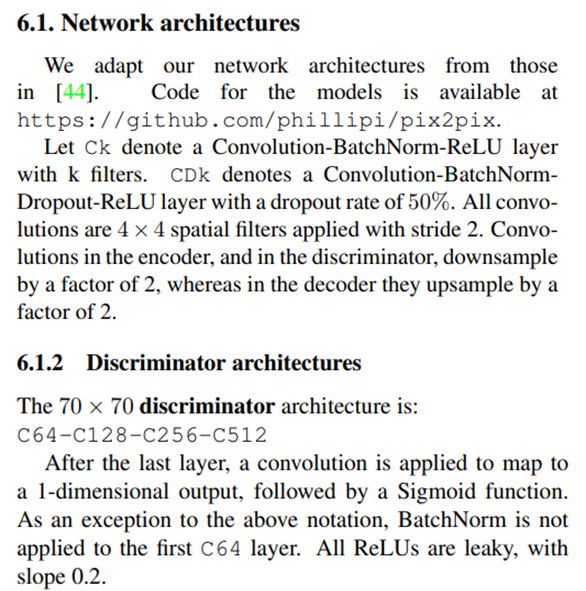

진짜 및 가짜 이미지를 판별하기 위해 최종 출력에 sigmoid를 사용하는 것을 제외하면 특별한 변경 사항은 없는 것 같다.

아래에 Discriminator 전체 구조를 보기 쉽게 표현한 그림이 있다.<br>

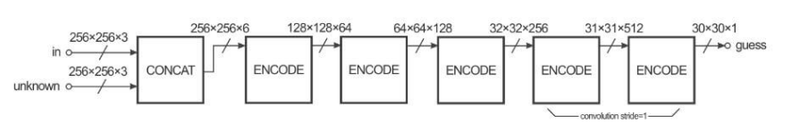<br>
[https://neurohive.io/en/popular-networks/pix2pix-image-to-image-translation/](https://neurohive.io/en/popular-networks/pix2pix-image-to-image-translation/)<br>

Discriminator는 2개 입력(위 그림의 "in", "unknown")을 받아 연결(CONCAT)한 후, ENCODE 라고 쓰인 5개의 블록을 통과한다. 

이 중 마지막 블록을 제외한 4개 블록은 위 논문에서 표기된 "C64-C128-C256-C512"에 해당하며, 

마지막은 1(채널)차원 출력을 위한 블록이 추가되어있다.

최종적으로 출력되는 크기는 (30,30,1) 이며, 위 그림의 출력 이전의 2개의 ENCODE 블록을 보면

각각의 출력 크기가 32, 31, 30으로 1씩 감소하는 것을 알 수 있다.

추가적으로 위 그림에서 최종 출력 크기가 (30,30,1)이 되어야 하는 이유는 70x70 PatchGAN을 사용했기 때문인데,

최종 (30,30) 출력에서 각 픽셀의 receptive field 크기를 (70,70)으로 맞추기 위해 Discriminator의 출력 크기를 (30,30) 크기로 강제로 맞추는 과정이다.

Convolution Layer 에서 kernel크기, stride, padding 등을 토대로 출력 크기를 계산했던 방식을 그대로 사용하면 계산할 수 있다.

자세한 계산 과정은 아래의 링크를 참고하자.

- [Understanding PatchGAN](https://medium.com/@sahiltinky94/understanding-patchgan-9f3c8380c207)

&nbsp;

Discriminator에 사용할 기본적인 블록을 만든다.

In [21]:
class DiscBlock(layers.Layer):
    ## __init__() 에서 필요한 만큼 많은 설정을 가능하게끔 구현
    ## 필터의 수(n_filters), 
    ## 필터가 순회하는 간격(stride), 
    ## 출력 feature map의 크기를 조절할 수 있도록 하는 패딩 설정(custom_pad), 
    ## BatchNorm의 사용 여부(use_bn), 
    ## 활성화 함수 사용 여부(act)가 설정 가능
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 

print("✅")

✅


사용할 기본적인 블록을 만들었으니 이를 이용해 Discriminator를 만들어보자.

In [22]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        ## (주석 처리된 부분과 같이) for loop로 간편하게 블록을 만들 수도 있지만, 
        ## 쉽게 코드를 읽게끔 총 6개 블록을 각각 따로 만들었다.
        
        ## 첫 번째 블록은 단순한 연결(concat)을 수행
        self.block1 = layers.Concatenate()    
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        ## Discriminator의 최종 출력은 sigmoid 활성화를 사용
        self.sigmoid = layers.Activation("sigmoid")
        
        ## for loop
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y):
        out = self.block1([x, y]) 
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    
print("✅")

✅


각 블록의 출력 크기가 알맞게 되었는지 아래 코드로 확인해보자.

In [23]:
Discriminator().get_summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_5[0][0]                    
                                                                 input_6[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

두 개의 (256,256,3) 크기 입력으로 최종 (30,30,1) 출력을 만들었고, 

아래의 Discriminator를 나타낸 그림과 각 출력 크기가 일치한다.

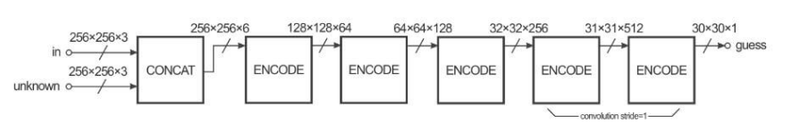

시험 삼아 임의의 (256,256,3) 크기의 입력을 넣어 나오는 (30,30) 출력을 시각화해보자.

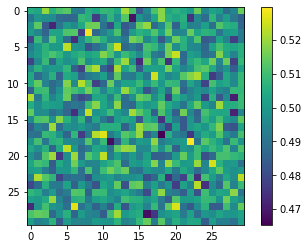

In [24]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

이전 PatchGAN에 대해 설명에서처럼, 위 (30,30) 크기를 갖는 결과 이미지의 각 픽셀 값은 원래 입력의 (70,70) 패치에 대한 분류 결과이다. 전체 입력의 크기가 (256,256) 이므로, 각각의 (70,70) 패치는 원래 입력상에서 많이 겹쳐있게 된다. 각각의 픽셀 값은 sigmoid 함수의 결과값이므로 0~1 사이의 값을 가지며, 진짜 및 가짜 데이터를 판별해 내는 데 사용한다.

&nbsp;

## 06 > 학습 및 테스트

구현된 Generator와 Discriminator를 학습시켜보고, 스케치를 입력으로 채색된 이미지를 생성해 보기에 앞서,

먼저 학습에 필요한 손실 함수부터 정의하도록 하자.

논문의 여러 실험 결과 중 손실 함수 선택에 따른 결과의 차이는 아래와 같다.

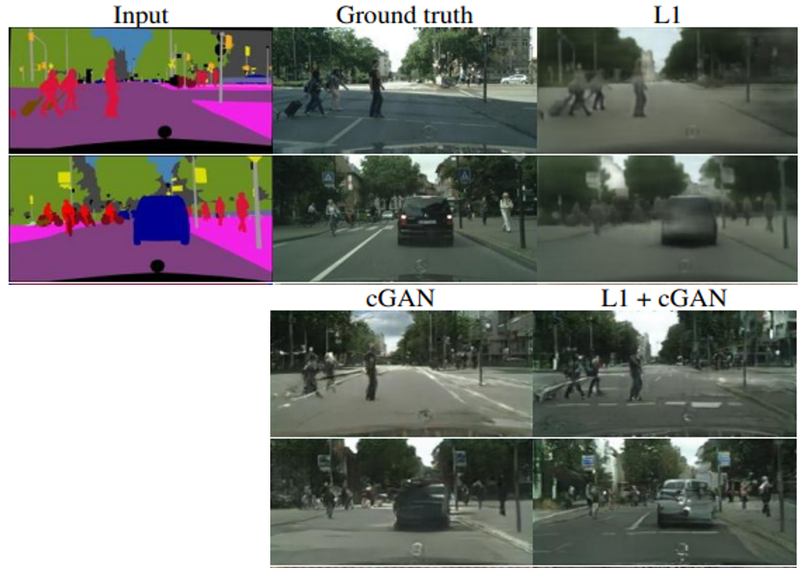

일반적인 GAN의 손실 함수에 L1을 추가로 이용했을 때 가장 실제에 가까운 이미지를 생성한 것을 확인할 수 있다.

여기서도 두 가지 손실 함수를 모두 사용하도록 하겠다.



 - Generator loss：생성된 이미지와 이미지 배열의 sigmoid cross-entropy loss.
 
 - pix2pix 논문에는 생성된 이미지와 대상 이미지 사이의 MAE(mean absolute error)인 L1 손실도 언급되어 있다.
 
 - 이것들로 생성된 이미지가 대상 이미지와 구조적으로 유사해질 수 있다.
 
 - 총 Generator 손실을 계산하는 공식은 아래에 따로 다루는데, 그 값은 논문의 저자가 결정한 값을 사용한다.
 

- Discriminator loss：실제 이미지와 생성된 이미지의 두가지 입력을 받는다.

- real_loss：실제 이미지와 그 배열의 sigmoid cross-entropy loss. 여기서는 `bce(tf.ones_like(real_disc), real_disc)` 부분

- generated_loss：생성된 이미지와 0 배열의 sigmoid cross-entropy loss. 여기서는 `bce(tf.zeros_like(fake_disc), fake_disc)` 부분

- total_loss：real_loss 와 generated_loss 의 합. 여기서는 `get_disc_loss 의 반환 값.`

In [25]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    ## Mean absolute error
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

print("✅")

✅


- get_gene_loss
   + Generator의 손실 함수. 총 3개의 입력.
   + fake_disc는 Generator가 생성한 가짜 이미지를 Discriminator에 입력하여 얻어진 값
   + 실제 이미지를 뜻하는 "1"과 비교하기 위해 tf.ones_like()를 사용.
   + L1 손실을 계산하기 위해 생성한 가짜 이미지(fake_output)와<br>실제 이미지(real_output) 사이의 MAE(Mean Absolute Error)를 계산한다.

- get_disc_loss
   + Discriminator의 손실 함수. 2개의 입력.
   + 가짜 및 진짜 이미지가 Discriminator에 각각 입력되어 얻어진 값. 
   + Discriminator는 실제 이미지를 잘 구분해 내야 하므로 <br>real_disc는 "1"로 채워진 벡터와 비교하고, <br>fake_disc는 "0"으로 채워진 벡터와 비교.


optimizer는 논문과 동일하게 아래와 같이 설정

In [26]:
from tensorflow.keras import optimizers

# gene_opt = optimizers.Adam(2e-4, beta_1=0.5, beta_2=0.999)
# disc_opt = optimizers.Adam(2e-4, beta_1=0.5, beta_2=0.999)
gene_opt = optimizers.Adam(2e-4, beta_1=0.5)
disc_opt = optimizers.Adam(2e-4, beta_1=0.5)

print("✅")

✅


하나의 배치 크기만큼 데이터를 입력했을 때, 가중치를 1회 업데이트하는 과정은 아래와 같이 구현한다.

In [27]:
LAMBDA = 100

In [28]:
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (LAMBDA * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

print("✅")

✅


위 코드의 gene_total_loss 계산 라인에서 최종 Generator 손실을 계산할 때, 

L1 손실에 100을 곱한 부분이 있는데, 논문에서는 Generator의 손실을 아래와 같이 정의했다.

$$G^* = arg\ \underset{G}{min}\ \underset{D}{max}\ \textit{L}_{cGAN}(G, D)+\lambda \textit{L}_{L1}(G)$$


$λ$는 학습 과정에서 L1 손실을 얼마나 반영할 것인지를 나타내며 논문에서는 $λ=100$을 사용했다.

앞서 정의한 함수를 이용해서 우선 10 epoch 이상 학습해보자.

In [29]:
EPOCHS = 10

generator = UNetGenerator()
discriminator = Discriminator()

## History
hist_gene_loss = []
hist_l1_loss = []
hist_disc_loss = []

for epoch in range(1, EPOCHS+1):
    for i, (sketch, colored) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(sketch, colored)
        
        if (i+1) % 25 == 0:
            hist_gene_loss.append(g_loss)
            hist_l1_loss.append(l1_loss)
            hist_disc_loss.append(d_loss)
            
        # 250회 반복마다 손실을 출력.
        if (i+1) % 1000 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                \nGenerator_loss:{g_loss.numpy():.4f} \
                \nL1_loss:{l1_loss.numpy():.4f} \
                \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

Loss 를 시각화 하면 다음과 같다.

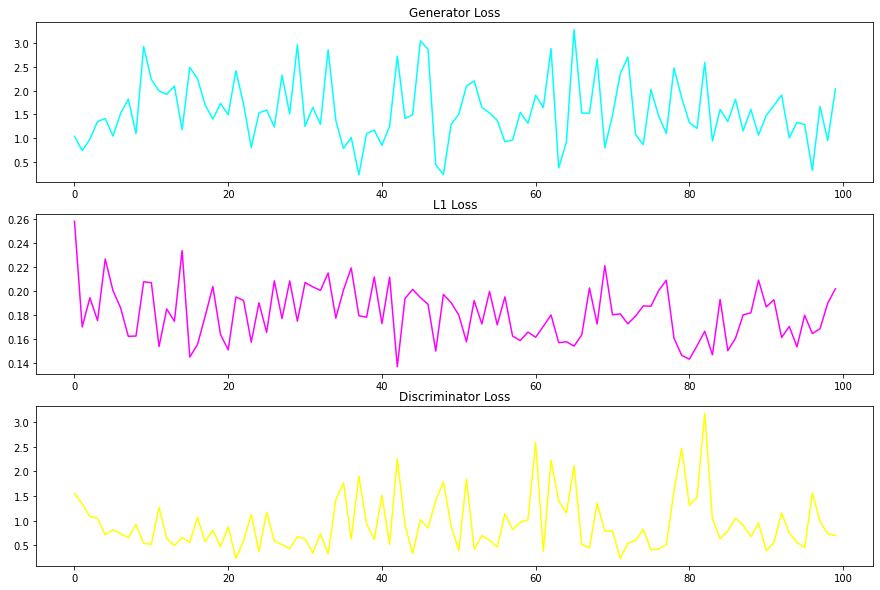

In [30]:
plt.figure(figsize=(15,10))

plt.subplot(311)
plt.plot(hist_gene_loss, color="cyan")
plt.title('Generator Loss')

plt.subplot(312)
plt.plot(hist_l1_loss, color="magenta")
plt.title('L1 Loss')

plt.subplot(313)
plt.plot(hist_disc_loss, color="yellow")
plt.title('Discriminator Loss')
plt.show()

결과를 확인해보자.

299
866
823
148
830


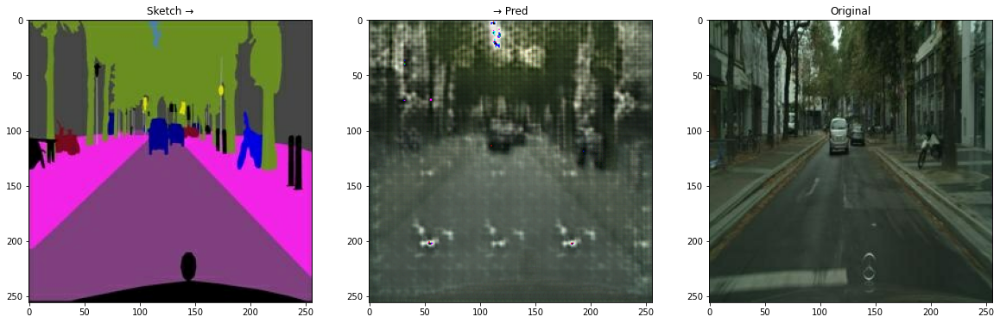

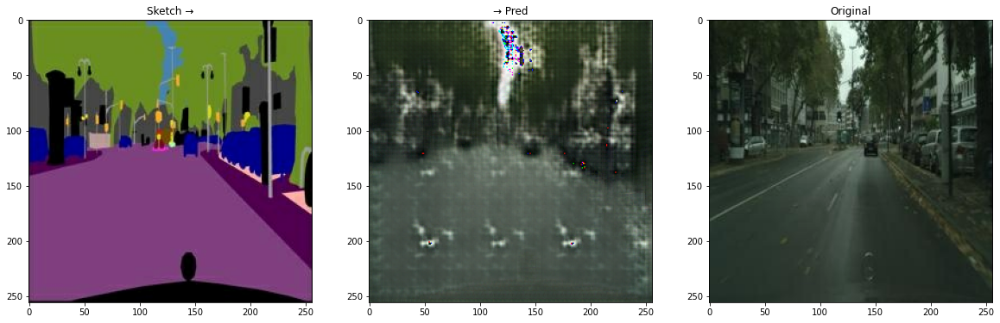

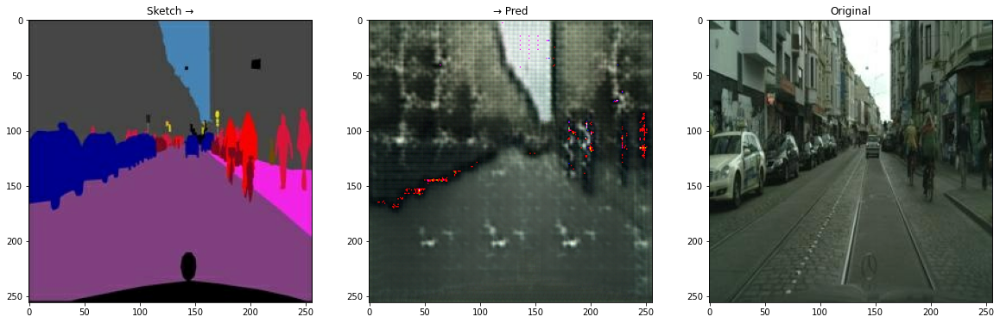

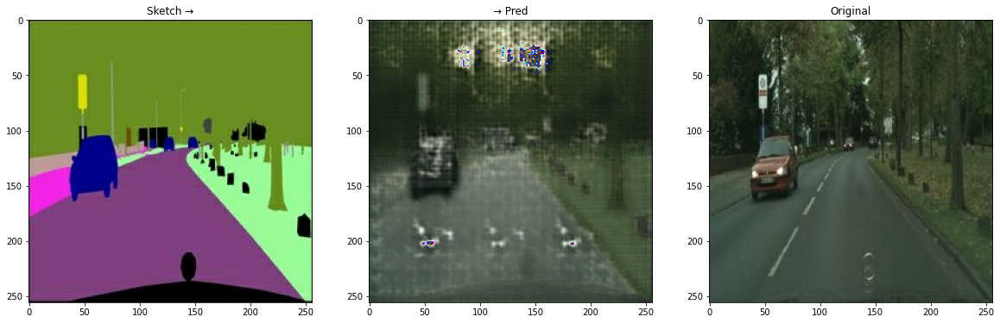

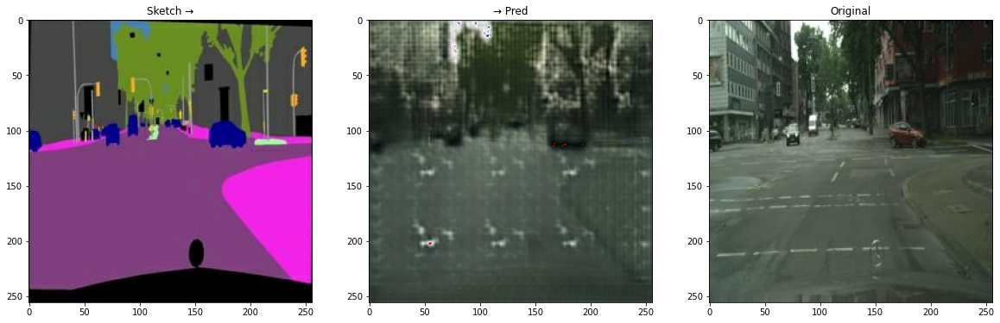

In [31]:
pics = 5
plot_idx = 1

## 학습 이미지에서 랜덤으로 pics 갯수 만큼 가져와서 출력한다.
for test_ind in np.random.randint(len(os.listdir(train_path)), size=pics):
    print(test_ind)
    f = train_path + os.listdir(train_path)[test_ind]
    sketch, colored = load_img(f)

    pred = generator(tf.expand_dims(sketch, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 35))
    plt.subplot(pics, 3, plot_idx); plt.imshow(denormalize(sketch)); plt.title("Sketch →")
    plt.subplot(pics, 3, plot_idx + 1); plt.imshow(pred[0]); plt.title("→ Pred")
    plt.subplot(pics, 3, plot_idx + 2); plt.imshow(denormalize(colored)); plt.title("Original")
    plot_idx = plot_idx + 3

&nbsp;

더 많은 학습을 반복해보자.

반복횟수를 늘리기 전에 기존에 사용했던 내용들의 초기화 과정이 필요하다.

In [32]:
## History
hist_gene_loss = []
hist_l1_loss = []
hist_disc_loss = []

그럼 마지막으로 여러번 학습을 수행해보자.

In [33]:
EPOCHS = 50

for epoch in range(1, EPOCHS+1):
    for i, (colored, sketch) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(colored, sketch)
        
        ## 그래프가 너무 복잡해지지 않게 loss 값 수집횟수를 조정
        if (i+1) % 25 == 0:
            hist_gene_loss.append(g_loss)
            hist_l1_loss.append(l1_loss)
            hist_disc_loss.append(d_loss)
        
        # 250회 반복마다 손실을 출력.
        if (i+1) % 1000 == 0:
            
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                \nGenerator_loss:{g_loss.numpy():.4f} \
                \nL1_loss:{l1_loss.numpy():.4f} \
                \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

196
949
267
992
62


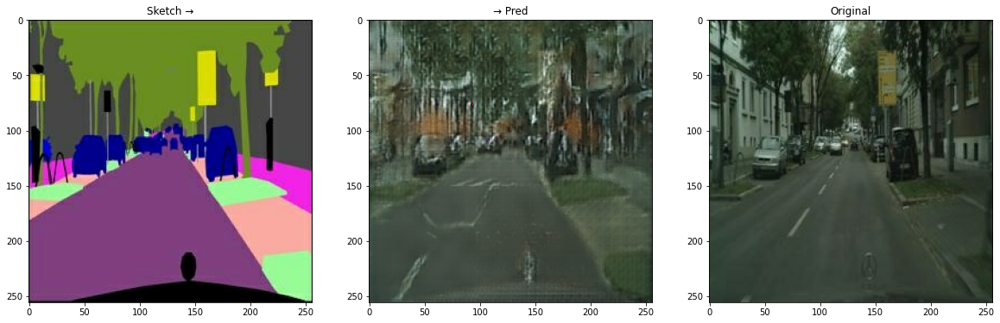

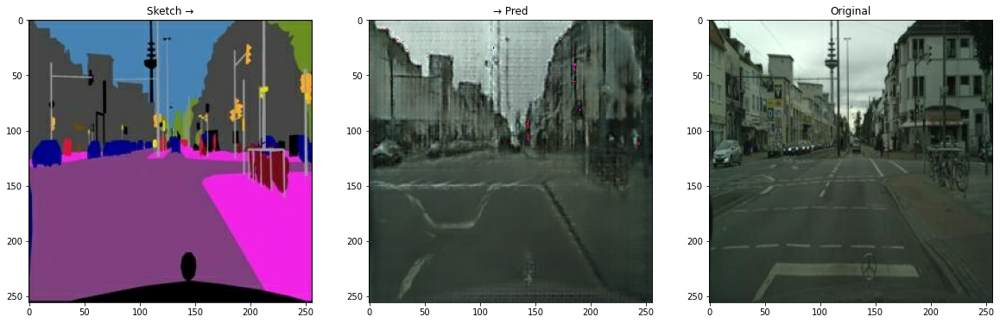

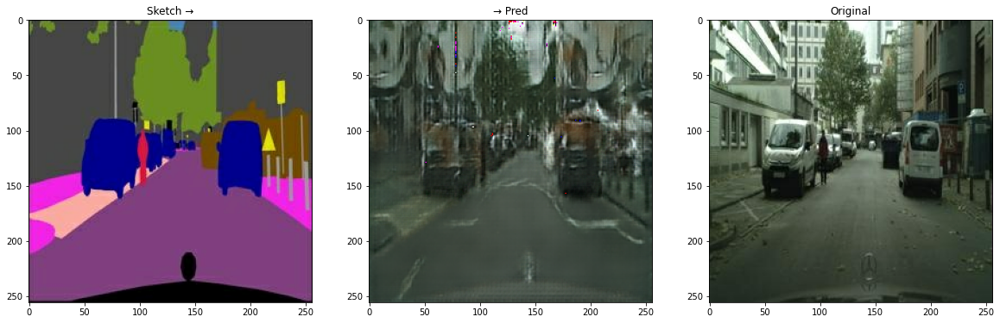

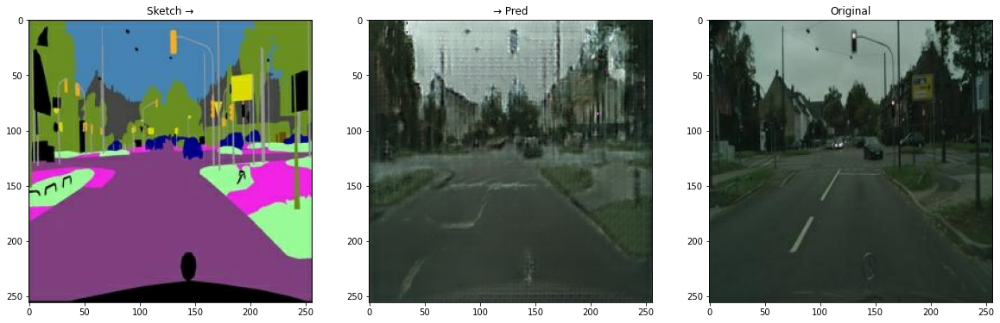

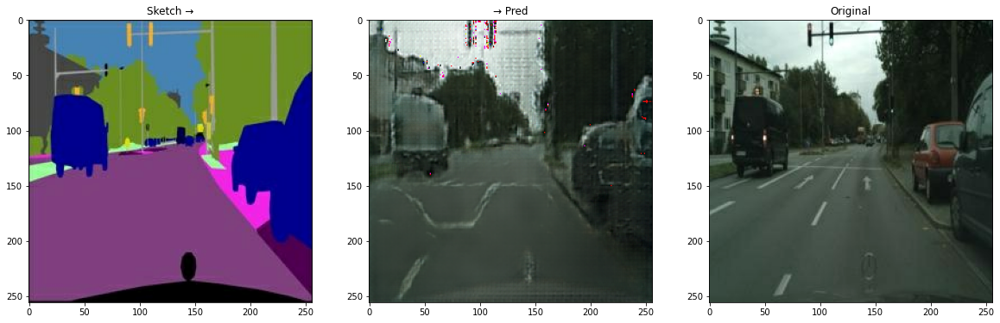

In [34]:
## 학습 이미지에서 랜덤으로 pics 갯수 만큼 가져와서 출력한다.
pics = 5
plot_idx = 1
for test_ind in np.random.randint(len(os.listdir(train_path)), size=pics):
    print(test_ind)
    f = train_path + os.listdir(train_path)[test_ind]
    sketch, colored = load_img(f)

    pred = generator(tf.expand_dims(sketch, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 35))
    plt.subplot(pics, 3, plot_idx); plt.imshow(denormalize(sketch)); plt.title("Sketch →")
    plt.subplot(pics, 3, plot_idx + 1); plt.imshow(pred[0]); plt.title("→ Pred")
    plt.subplot(pics, 3, plot_idx + 2); plt.imshow(denormalize(colored)); plt.title("Original")
    plot_idx = plot_idx + 3

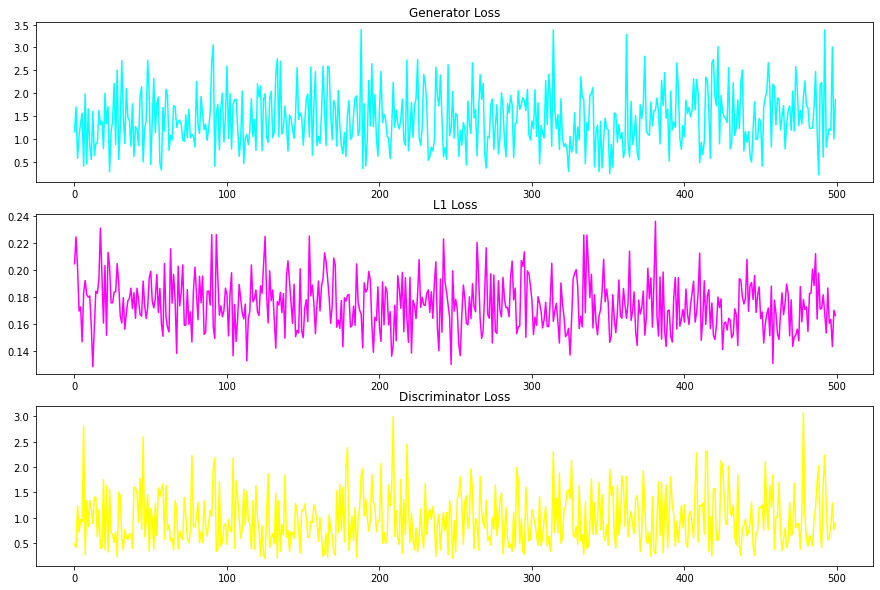

In [35]:
plt.figure(figsize=(15,10))

plt.subplot(311)
plt.plot(hist_gene_loss, color="cyan")
plt.title('Generator Loss')

plt.subplot(312)
plt.plot(hist_l1_loss, color="magenta")
plt.title('L1 Loss')

plt.subplot(313)
plt.plot(hist_disc_loss, color="yellow")
plt.title('Discriminator Loss')
plt.show()

이제 valid 데이터 5 개를, 학습된 Generator 를 이용하여 테스트 해 보자.

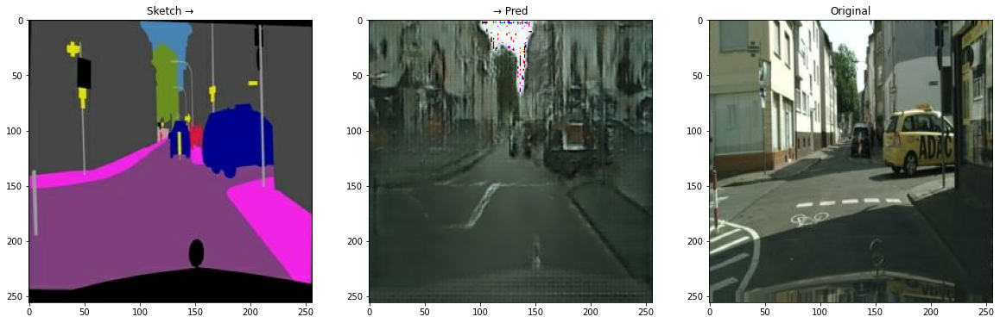

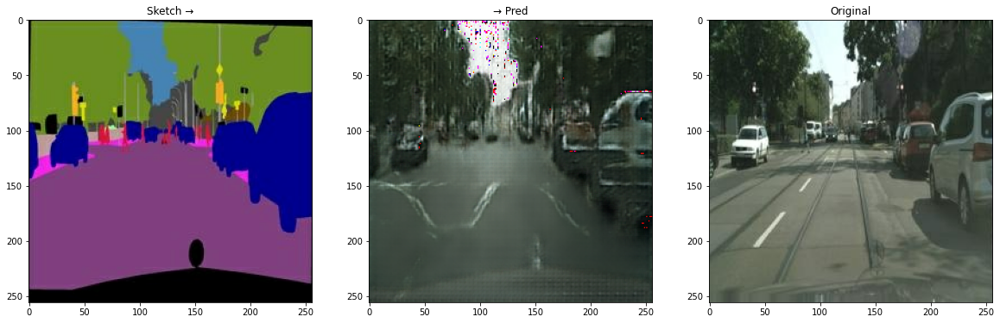

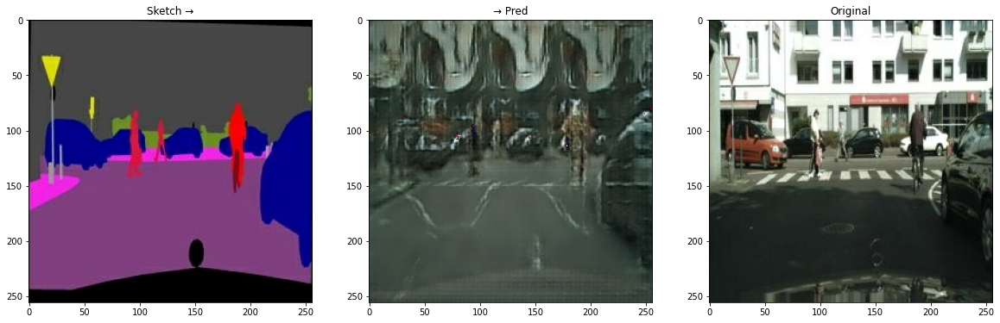

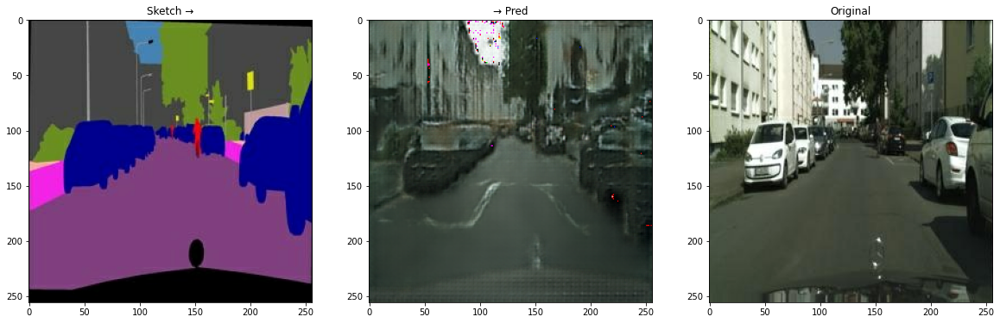

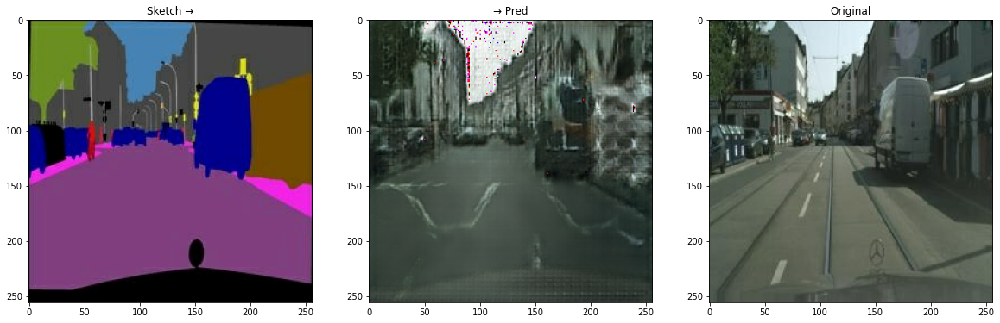

In [36]:
## 테스트 이미지에서 랜덤으로 pics 갯수 만큼 가져와서 출력한다.
pics = 5
plot_idx = 1
for valid_ind in range(len(os.listdir(valid_path))):
    f = valid_path + os.listdir(valid_path)[valid_ind]
    sketch, colored = load_img(f)

    pred = generator(tf.expand_dims(sketch, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20, 35))
    plt.subplot(pics, 3, plot_idx); plt.imshow(denormalize(sketch)); plt.title("Sketch →")
    plt.subplot(pics, 3, plot_idx + 1); plt.imshow(pred[0]); plt.title("→ Pred")
    plt.subplot(pics, 3, plot_idx + 2); plt.imshow(denormalize(colored)); plt.title("Original")
    plot_idx = plot_idx + 3

&nbsp;

<hr>

### ■ 프로젝트 회고

#### 1) 이번 프로젝트에서 '어려웠던 점'

이번에는 논문 「Image-to-Image Translation with Conditional Adversarial Networks」 을 기반으로,

GAN, pix2pix, U-Net 을 이용하여 여러 가지 방법으로 논문의 증명을 코드로 구현해 보면서 실습을 해 보았다.

프로젝트는 이미지를 입력으로 사용하여 색상을 입히는 프로젝트(pix2pix)로 마무리 하는 구성이었다.

논문의 저자가 직접 제시한 내용들을 고스란히 코드로 옮겨놓은 것들이 많았다.

Paper의 내용을 코드로 옮겨 놓은 것들은 GitHub 에서도 찾아 볼 수 있고, 

거의 동일한 구현을 TensorFlow 공식 웹문서에서도 Tutorial／Guide 에서 찾아 볼 수 있었다.

노드 학습 내용을 참고하여 실습 부분에서 이용한 코드들을 재사용 하는 과정에서,

외부 참고자료들과 논문의 내용상 구현이 동일한 것에 착안하여, 해당 내용으로

기존에 재사용한 코드들을 변경하여, 그 구현을 최대한 동일하게 만들어 보았으나.

학습을 진행하고 결과를 확인하는데 채색한 이미지가 온통 새카만 이미지가 나와서 눈앞이 캄캄해졌다.

손을 대면 댈 수록 더 나빠진다는 결과를 이번에도 또 경험했다.

너무 슬펐다. 논문에 나온대로 구현했는데, 참 난감하다.

결국 대부분 내용을 되돌렸지만, 그래도 최대한 논문 흔적을 남겨두었다.


#### 2) 프로젝트를 진행하면서 본인이 '학습한 내용'

노드 구현 내용과 논문의 내용을 교차검증하면서 진행하는 과정에서

데이터증강 기법을 다시 한번 사용해 보았고, 추가적인 증강을 적용하고자 이런 저런 시도를 해 보았다.

최종적으로는 결과에 악영향을 주는 것 같아서 대부분은 삭제 하였지만,

동일한 로직을 여러가지 방법으로 구현해 놓은 Colab, TensorFlow Guide, LMS 실습 코드들을 보면서

약간이지만 여러 코딩 스타일을 접해보고 학습할 수 있는 기회였다고 생각한다.

ConditionalGAN, PatchGAN, Encoder-Decoder, U-Net 구조 등에 대해서도 학습했던 내용들을 정리하여

프로젝트 부분부분 내용을 기록하였고, 기본적으로는 최상단에 학습내용 정리를 하였다.

#### 3) 프로젝트를 진행하면서 '알아낸 점' 혹은 '아직 모호한 점'

논문에서, 여러가지 분석 결과등을 많이 다루고 있고,

코드와 연계하여 설명이 잘 되어 있고 실험에 대한 설명도 많은 양에 걸쳐서 다루고 있었다.

레퍼런스가 탄탄하게 잘 구성되어 있는 프로젝트여서,

해당 내용을 미리 참고해 진행하는 것으로 생성모델을 다른 방법으로 사용하는 과정에서

시행착오를 많이 줄일 수 있어서 효율적인 학습을 할 수 있었다.

모호한점은… 논문에서 처럼 결과가 안나와서 아쉬운 점이 있다는 점 때문에 생각나는

참고자료들에서는 뭔가 더 처리한게 있는 것 같은데, 그 부분이 확인이 어려웠다.

레이어 구성이나 학습등을 본격적으로 비교하기에는 시간여유도 없고,

전반적으로 튜닝이나 개섭 부분에서는 스스로 생각하기에도 미비된 점도 많은 듯 하다.

대부분 어려운 내용이지만, 굳이 선택하자면, PatchGAN 부분이 제일 모호한 것 같다.

#### 4) 루브릭 평가 지표를 맞추기 위해 '시도한 것들'

특별한 시도는 없었다. 논문 내용 구현하는 과정에서 대부분 루브릭 지표가 만족되는 내용이었다.

품질은 미미하게 나아지는데 200 Epochs 초과해서 실험한 결과로는, 100 epoch 보다 품질이 더 안좋아지는 것 같다.

데이터 증강 파트에서 zoom → crop, resize(286, 286) → random_crop(256, 256) 등을 추가적으로 구현하려 했는데,

결과적으로 적용해서 이득을 못보고 오히려 상태가 더 악화되는 것만 같아서 적용은 하지 않았다.

논문 과 논문을 레퍼런스로 한 공식 코드들의 여러가지 공통점을 정리하여 적용 해보기도 하였으나,

일부는 흔적이 남아 있을 것이고, 사용했을때 큰 문제가 없는 경우는 레퍼런스와 같은 방법으로 구현／적용 하는 시도를 해 보았다.

#### 5) 만약에 '루브릭 평가 지표를 달성하지 못했을 때, 이유에 관한 추정'

루브릭 평가지표에서는 프로젝트를 온전히 마무리 하였을 때에 대부분 달성이 된다고 생각한다.

베이스라인이 워낙에 잘 짜여져 있고, 노드 실습 부분에서도 별도의 참고할 만한 자료들을

제시하고 있는데, 해당 자료들도 논문 내용을 충실히 구현하고 있다.

완성을 목표로 접근한다면 루브릭 조건자체는 어렵지 않게 저절로 해결될 것이라고 생각한다.

#### 6) 자기 다짐

최근들어 논문 내용을 기반으로 모델을 구현하는 빈도가 많은 것 같다.

여러가지 실험을 해 보는 과정들도 대부분 논문에서 제시하고 있는 연구 분석 내용을 토대로 실험을 하고,

전체적으로 논문에 내용을 충실히 구현하고 결과들을 확인하는 방법이다.

앞으로의 프로젝트들도 비슷한 방법으로 진행이 될 것 같아서, 이러한 과정에 익숙해지고자

참고자료들과 논문을 항상 열어놓고 번갈아 가면서 보려고 노력하고 있다.

영어의 어려움도 있고, 복잡한 모델의 경우 온전히 이해하지 못하고 넘어가는 경우도 많았지만

LMS 노드에서 채우지 못한 부분을 참고하기에, 딱 적합한 논문이 있다는 사실은

제법 심리적 안정감을 가져다 주는 효과가 있는것 같다. 물론 도움이 된다는 점도 두말하면 잔소리다.

마지막 Exploration Node 라서 제일 고생할 것 같았는데, 훈련에 걸리는 시간이 길고

내용이 복잡하고 어렵다는 것은 여전하지만, 완성까지 시간은 그렇게 오래 걸린 것 같지 않다.

결과가 만족스럽지는 않아도, 이정도면 충분히 납득은 할 정도의 결과라,

마지막 노드를 괜찮게 마무리 한 것 같다. 시원 섭섭한 느낌이다.

&nbsp;

<hr>

## ◎ Reference

- (AIFFEL) Exploration Project Node 11. 인공지능으로 세상에 없던 새로운 패션 만들기

- (AIFFEL) Exploration Project Node 16. 난 스케치를 할 테니 너는 채색을 하거라

- (GAN) [TF2-GAN](https://github.com/thisisiron/TF2-GAN)

- (Paper) [Maxout Networks](https://arxiv.org/pdf/1302.4389.pdf)

- (Paper) [Pix2Pix를 제안한 논문의 제목은 Image-to-Image Translation with Conditional Adversarial Networks](https://arxiv.org/pdf/1611.07004.pdf)

- (U-Net) [U-Net 논문 리뷰](https://medium.com/@msmapark2/u-net-%EB%85%BC%EB%AC%B8-%EB%A6%AC%EB%B7%B0-u-net-convolutional-networks-for-biomedical-image-segmentation-456d6901b28a)

- (pix2pix) [Sketch2Pokemon info](https://www.kaggle.com/norod78/sketch2pokemon)

- (PatchGAN) [Understanding PatchGAN](https://medium.com/@sahiltinky94/understanding-patchgan-9f3c8380c207)

- (pix2pix) [네이버 AI Painter](https://ai.webtoons.com/painter)

- (pix2pix) [Tensorflow Pix2Pix Tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko)

- (pix2pix) [pytorch-CycleGAN-and-pix2pix](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/pix2pix.ipynb)



<hr>

&nbsp;